In [6]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

In [5]:
def load_image_grayscale(path):
    img = Image.open(path).convert('L')  # Convert to grayscale
    img_np = np.array(img).astype(np.float32) / 255.0  # Normalize to [0, 1]
    return img_np

In [76]:
import numpy as np

# Define grid spacing
dy = 159  # y-direction (vertical)
dx = 213  # x-direction (horizontal)

# Generate coordinates centered around 0
y = np.arange(-3.5, 4.5) * dy  # 8 values (top to bottom)
x = np.arange(3.5, -4.5, -1) * dx  # 8 values (right to left)

# Create meshgrid
xx, yy = np.meshgrid(x, y)

# Stack and reshape into (1, 64, 2)
grid_points = np.stack([yy.ravel(), xx.ravel()], axis=1)  # (64, 2)
grid_3d = grid_points[None, :, :]  # (1, 64, 2)

print(grid_3d.shape)  # (1, 64, 2)


(1, 64, 2)


In [102]:
#scale grid_3d by a small factor
scale_factor = 1.2
grid_3d *= scale_factor
grid_3d

array([[[ -808.038,  1082.466],
        [ -808.038,   773.19 ],
        [ -808.038,   463.914],
        [ -808.038,   154.638],
        [ -808.038,  -154.638],
        [ -808.038,  -463.914],
        [ -808.038,  -773.19 ],
        [ -808.038, -1082.466],
        [ -577.17 ,  1082.466],
        [ -577.17 ,   773.19 ],
        [ -577.17 ,   463.914],
        [ -577.17 ,   154.638],
        [ -577.17 ,  -154.638],
        [ -577.17 ,  -463.914],
        [ -577.17 ,  -773.19 ],
        [ -577.17 , -1082.466],
        [ -346.302,  1082.466],
        [ -346.302,   773.19 ],
        [ -346.302,   463.914],
        [ -346.302,   154.638],
        [ -346.302,  -154.638],
        [ -346.302,  -463.914],
        [ -346.302,  -773.19 ],
        [ -346.302, -1082.466],
        [ -115.434,  1082.466],
        [ -115.434,   773.19 ],
        [ -115.434,   463.914],
        [ -115.434,   154.638],
        [ -115.434,  -154.638],
        [ -115.434,  -463.914],
        [ -115.434,  -773.19 ],
        

In [85]:
def spiral_center_out_indices(n_rows, n_cols):
    center_row = n_rows // 2
    center_col = n_cols // 2
    if n_rows % 2 == 0:
        center_row -= 1
    if n_cols % 2 == 0:
        center_col -= 1

    coords = []
    r, c = center_row, center_col
    directions = [(0, 1), (1, 0), (0, -1), (-1, 0)]  # right, down, left, up
    dir_idx = 0
    steps = 1

    # Always add center
    if 0 <= r < n_rows and 0 <= c < n_cols:
        coords.append((r, c))

    while len(coords) < n_rows * n_cols:
        for _ in range(2):  # two sides per ring
            for _ in range(steps):
                r += directions[dir_idx][0]
                c += directions[dir_idx][1]
                if 0 <= r < n_rows and 0 <= c < n_cols:
                    coords.append((r, c))
                    if len(coords) == n_rows * n_cols:
                        return coords
            dir_idx = (dir_idx + 1) % 4
        steps += 1

    return coords  # This return is just fallback


In [86]:
spiral_idx = spiral_center_out_indices(8, 8)
flat_indices = [r * 8 + c for r, c in spiral_idx]
grid_spiral = grid_3d[:, flat_indices, :]  # Shape: (1, 64, 2)
print(grid_spiral.shape)  # Should be (1, 64, 2)

(1, 64, 2)


In [87]:
grid_spiral


array([[[ -87.45,  117.15],
        [ -87.45, -117.15],
        [  87.45, -117.15],
        [  87.45,  117.15],
        [  87.45,  351.45],
        [ -87.45,  351.45],
        [-262.35,  351.45],
        [-262.35,  117.15],
        [-262.35, -117.15],
        [-262.35, -351.45],
        [ -87.45, -351.45],
        [  87.45, -351.45],
        [ 262.35, -351.45],
        [ 262.35, -117.15],
        [ 262.35,  117.15],
        [ 262.35,  351.45],
        [ 262.35,  585.75],
        [  87.45,  585.75],
        [ -87.45,  585.75],
        [-262.35,  585.75],
        [-437.25,  585.75],
        [-437.25,  351.45],
        [-437.25,  117.15],
        [-437.25, -117.15],
        [-437.25, -351.45],
        [-437.25, -585.75],
        [-262.35, -585.75],
        [ -87.45, -585.75],
        [  87.45, -585.75],
        [ 262.35, -585.75],
        [ 437.25, -585.75],
        [ 437.25, -351.45],
        [ 437.25, -117.15],
        [ 437.25,  117.15],
        [ 437.25,  351.45],
        [ 437.25,  5

In [38]:


def load_image_grayscale(path):
    img = Image.open(path).convert('L')  # Convert to grayscale
    img_np = np.array(img).astype(np.float32) / 255.0  # Normalize to [0, 1]
    return img_np

# Set the folder path and extension
folder_path = r"C:\Users\beery\OneDrive\桌面\Study\SoSe 2025 Jena\Imip\Captured photos\01.07.25"
file_extension = '.jpg'  # or '.jpg', etc.

# Load images in the specified order
image_list = []

for x in range(8):
    for y in range(8):
        filename = f'led_r{x}_c{y}{file_extension}'
        filepath = os.path.join(folder_path, filename)
        img = load_image_grayscale(filepath)
        image_list.append(img)


In [90]:
def display_low_res_images(images, grid_size):
    rows, cols = grid_size
    fig, axs = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows))
    for i in range(rows):
        for j in range(cols):
            idx = (rows - 1 - i) * cols + j  # Flip vertically
            axs[i, j].imshow(images[idx], cmap='gray')
            axs[i, j].axis('off')
            axs[i, j].set_title(f'Patch ({rows - 1 - i},{j})')  # Match LED row index
    plt.tight_layout()
    plt.show()

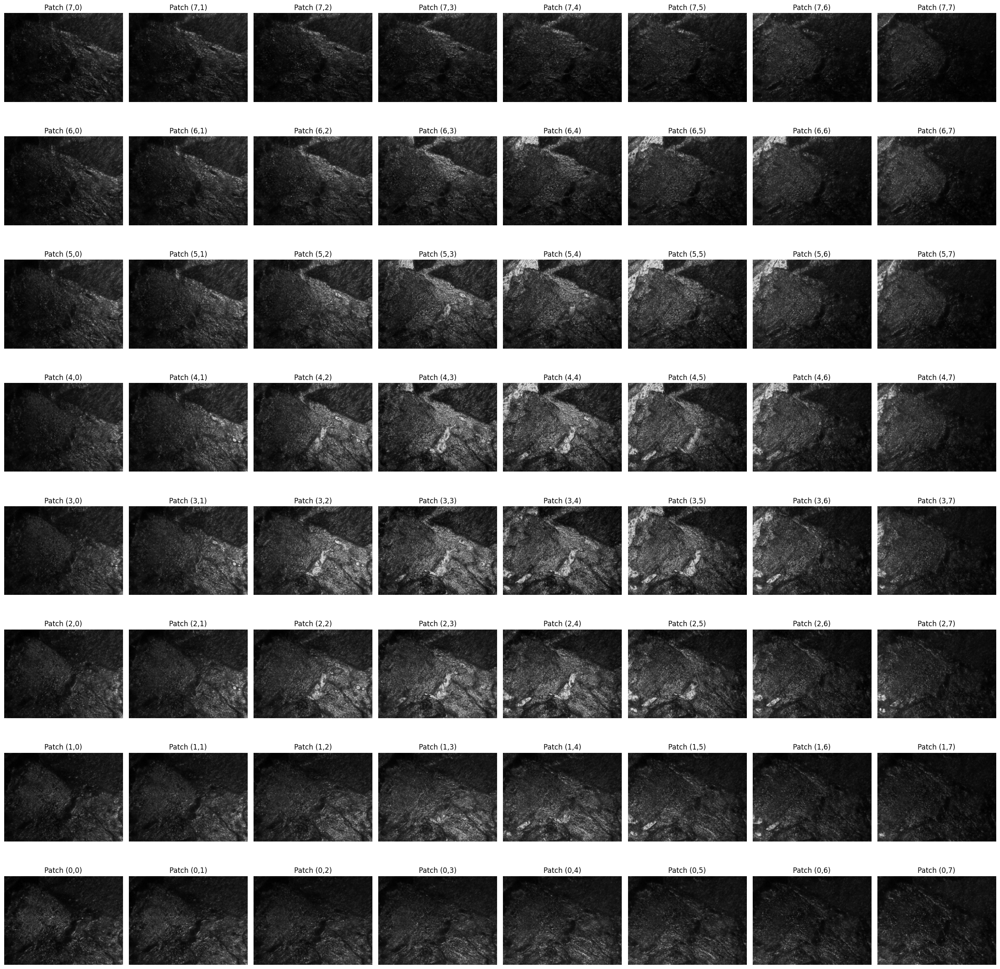

In [91]:
grid_size = (8, 8)  # 8x8 grid
# Display reconstructed images
display_low_res_images(image_list, grid_size)

In [43]:
image_list[1].shape

(480, 640)

Text(0.5, 1.0, 'Image at index 36')

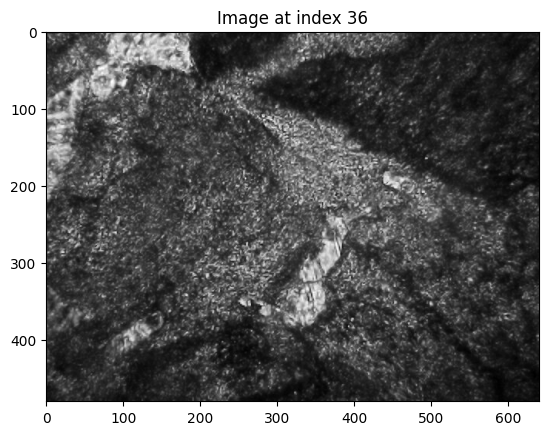

In [44]:
#cisualize a chosen image
index= 36  # Change this to visualize a different image
chosen_image = image_list[index]
plt.imshow(chosen_image, cmap='gray')
plt.title(f'Image at index {index}')

In [45]:
stacked_images = np.stack(image_list, axis=-1)
stacked_images.shape

(480, 640, 64)

In [92]:
# From list:
image_list_spiral = [image_list[i] for i in flat_indices]

# Convert to array if needed
image_array_spiral = np.stack(image_list_spiral, axis=0)
# Check shape
print(image_array_spiral.shape)  # Should be (64, height, width)

(64, 480, 640)


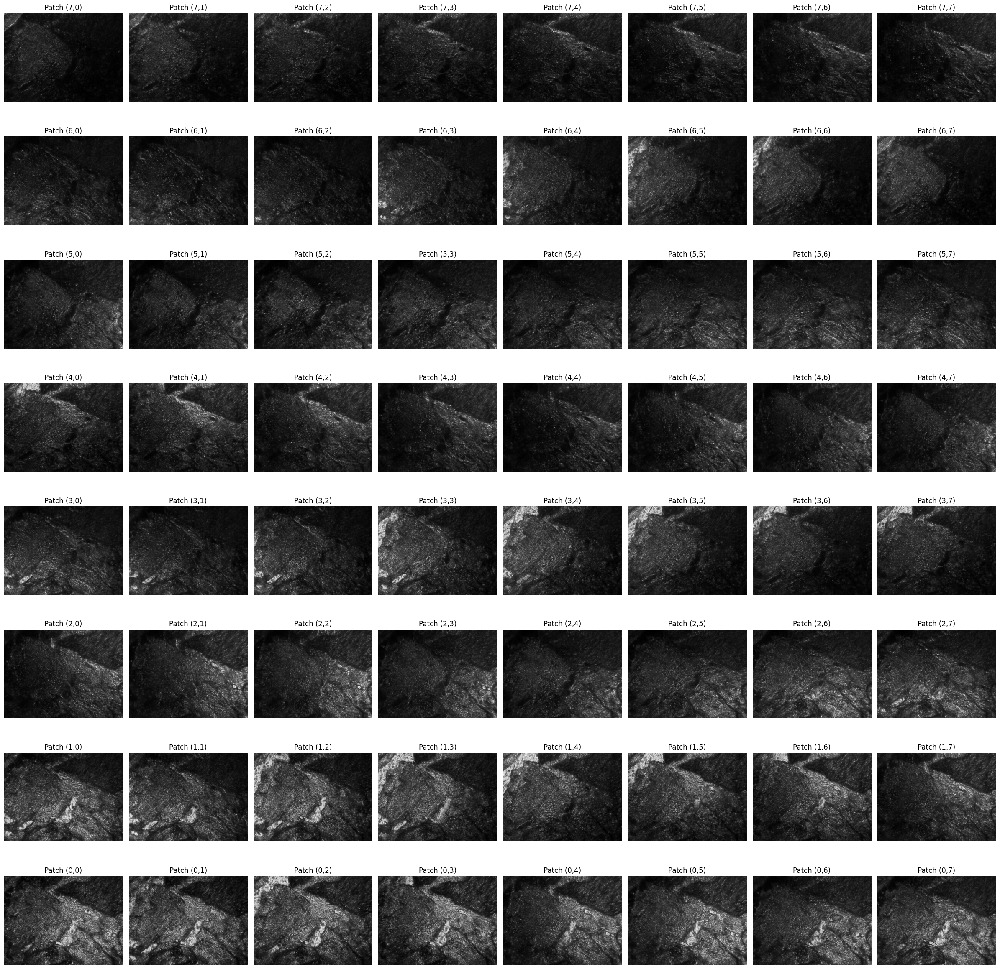

In [93]:
grid_size = (8, 8)  # 8x8 grid
# Display reconstructed images
display_low_res_images(image_array_spiral, grid_size)

In [94]:
stacked_images_spiral = np.stack(image_list_spiral, axis=-1)
stacked_images_spiral.shape

(480, 640, 64)

In [109]:
%load_ext autoreload
%autoreload 2
import Main_functions
from Main_functions import AlterMin

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


| iter |  rmse    |
--------------------
|  0   | inf |
|  1   | 8.88e+05 |
|  2   | 3.66e+04 |
|  3   | 3.47e+04 |
|  4   | 3.26e+04 |
|  5   | 3.10e+04 |
|  6   | 2.96e+04 |
|  7   | 2.86e+04 |
|  8   | 2.88e+04 |


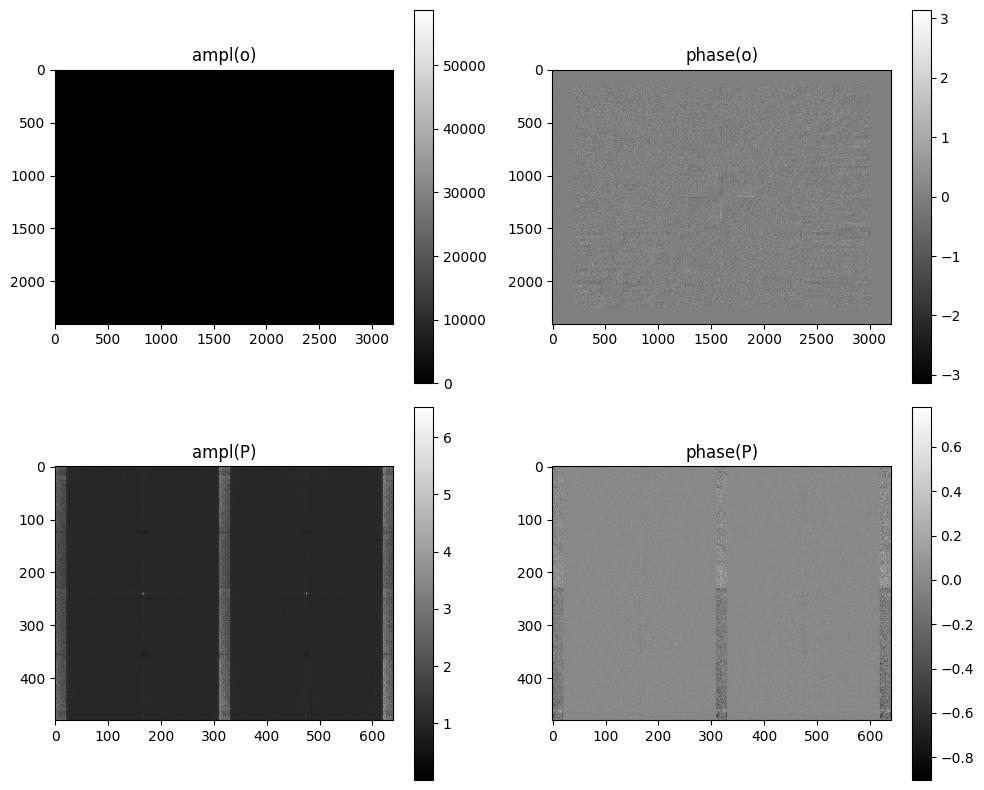

elapsed time: 64 seconds


In [110]:
# Stepsize 0.001
# Alpha Beta are both 10
dim=[2400, 3200]
O, P, err, scale, Ns = AlterMin(stacked_images, dim, grid_3d, {})


Text(0.5, 1.0, 'Optimized Image')

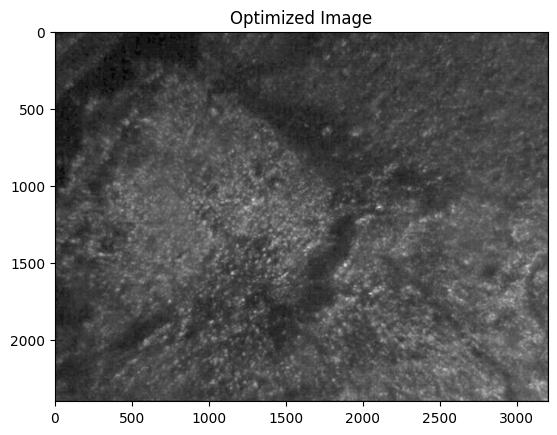

In [111]:
o_image=np.fft.ifft2(O)
plt.imshow(np.abs(o_image), cmap='gray')
# Display the optimized image
plt.title("Optimized Image")

In [49]:
o_image.shape

(2400, 3200)